<a href="https://colab.research.google.com/github/Channz414/Pengolahan-Citra-Digital/blob/main/Tugas7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ANALISIS DOMAIN FREKUENSI DAN WAVELET
Foto 'img4.jpeg' berhasil di-load.


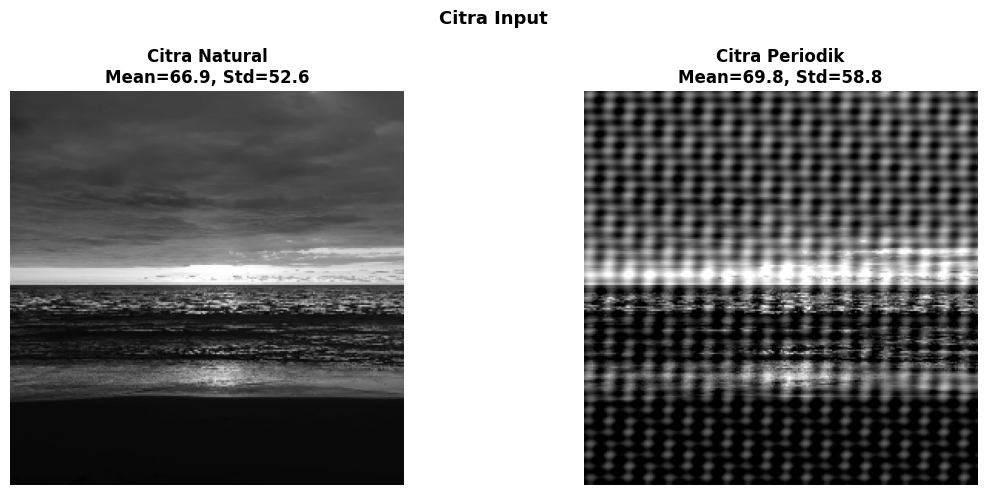


TRANSFORMASI FOURIER


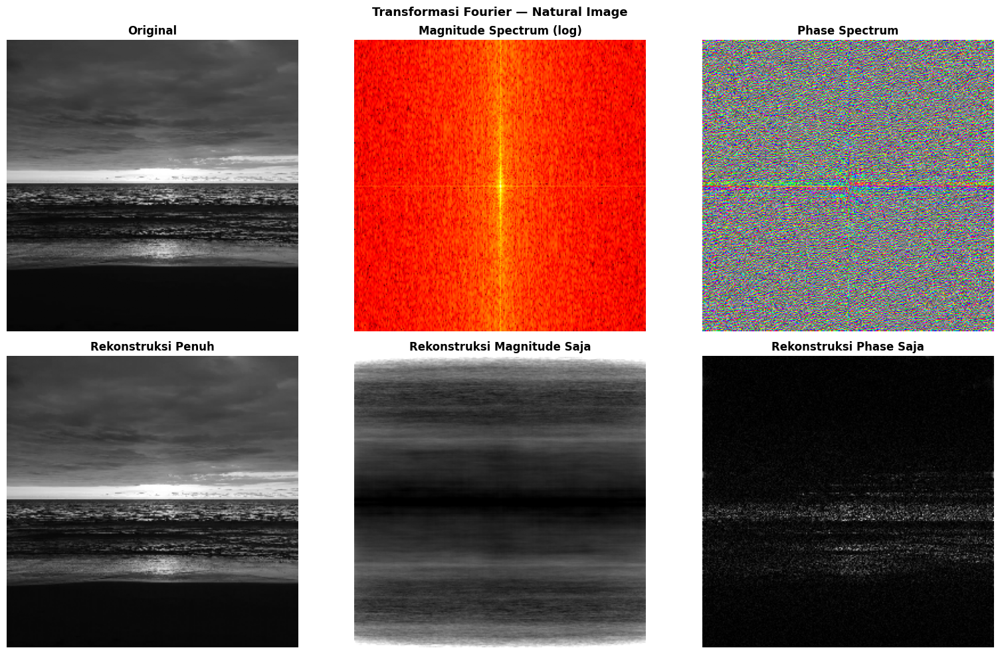


Komponen Frekuensi Dominan (Natural Image):
  Rank    u (col)  v (row)    Magnitude
  --------------------------------------
  1             0        1    1542739.9
  2             0       -1    1542739.9
  3             0       -3    1173100.6
  4             0        3    1173100.6
  5             0       -4     663804.7


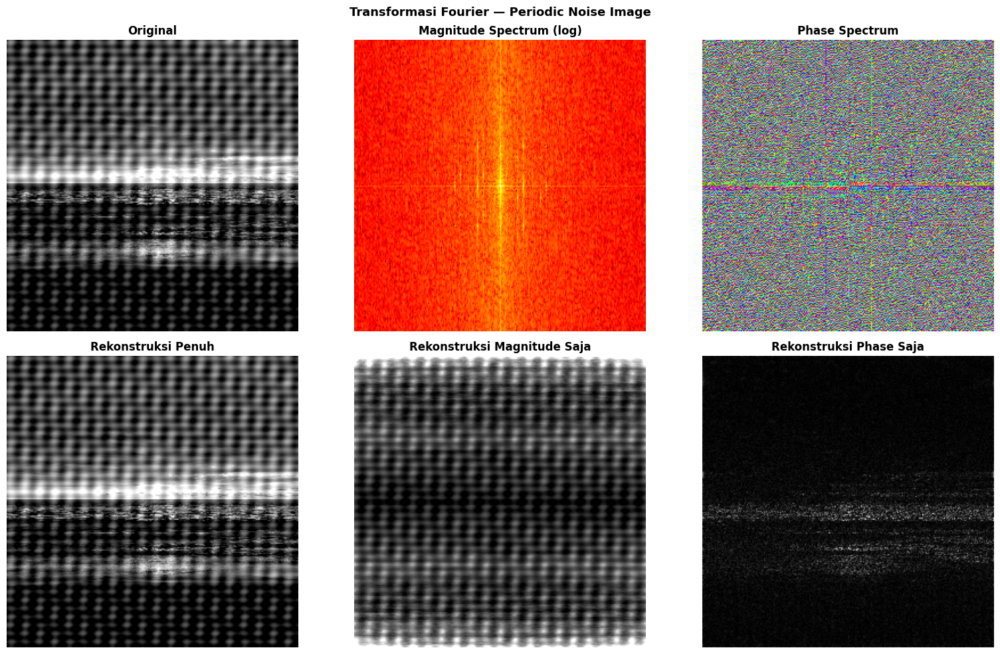


Komponen Frekuensi Dominan (Periodic Noise Image):
  Rank    u (col)  v (row)    Magnitude
  --------------------------------------
  1             0       -1    1382165.8
  2             0        1    1382165.8
  3            20        0    1127511.0
  4           -20        0    1127511.0
  5             0       -3    1071867.4

FILTERING DI DOMAIN FREKUENSI

Ideal Filter (Natural Image):
  Filter                 Cutoff        MSE   PSNR(dB)
  --------------------------------------------------
  Lowpass                    20     238.60      24.35
  Highpass                   20    5957.21      10.38
  Lowpass                    50     135.88      26.80
  Highpass                   50    6407.66      10.06
  Lowpass                    80      79.87      29.11
  Highpass                   80    6613.95       9.93


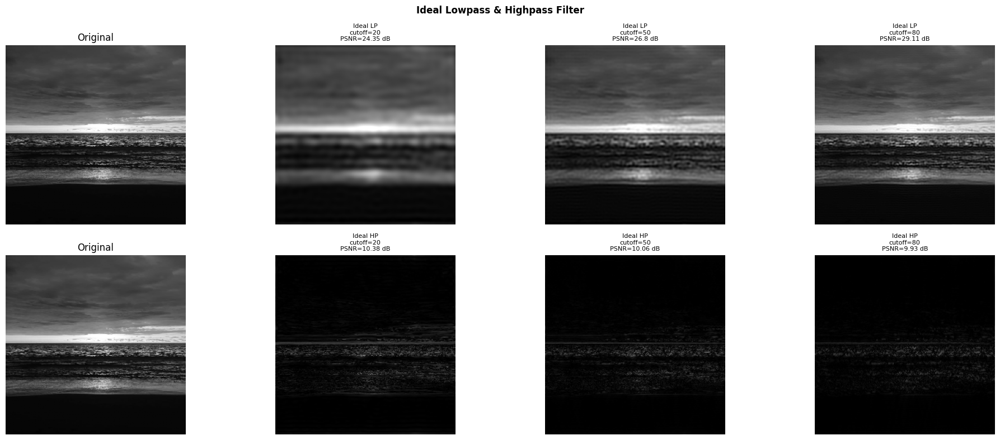


Gaussian Filter (Natural Image):
  Filter                 Cutoff        MSE   PSNR(dB)
  --------------------------------------------------
  Lowpass                    20     200.59      25.11
  Highpass                   20    6138.46      10.25
  Lowpass                    50      85.25      28.82
  Highpass                   50    6619.68       9.92
  Lowpass                    80      33.89      32.83
  Highpass                   80    6854.89       9.77


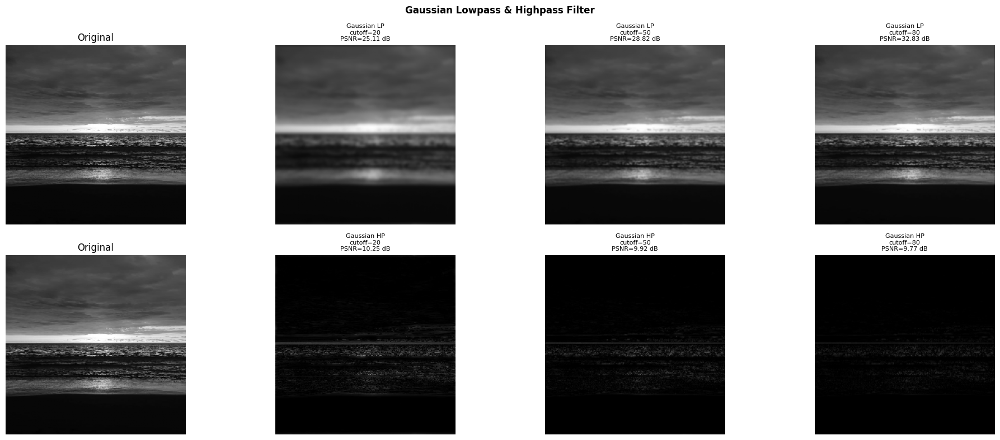


Notch Filter (Periodic Noise Image):


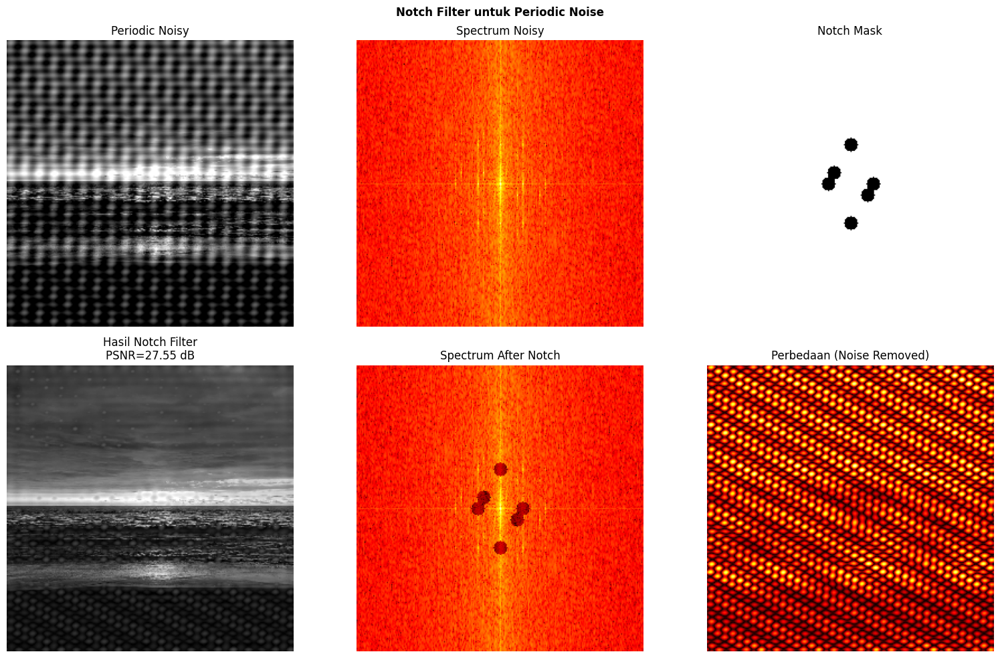

  MSE=114.27, PSNR=27.55 dB

PERBANDINGAN FILTER SPASIAL vs FREKUENSI

  Metode                      MSE   PSNR(dB)   Time(ms)
  ----------------------------------------------------
  Spatial Mean 15×15       361.17      22.55     0.1965
  Spatial Gauss 15×15      243.44      24.27     0.7301
  Freq Ideal LP-30         194.05      25.25     6.1902
  Freq Gauss LP-30         148.91      26.40     5.6408


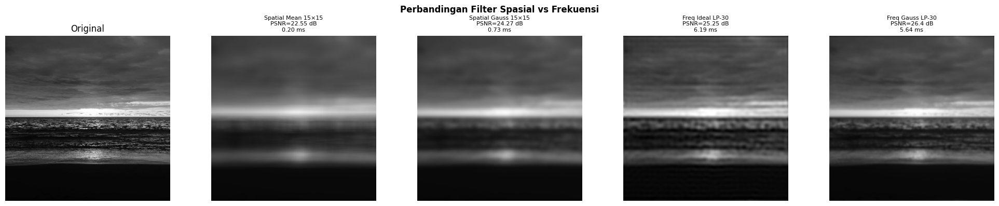


WAVELET TRANSFORM — HAAR (Natural Image)

Ukuran koefisien:
  Original   : (256, 256)
  Level 1 cA : (128, 128)  (Aproksimasi)
  Level 1 cH : (128, 128)  (Detail Horizontal)
  Level 2 cA : (64, 64)  (Aproksimasi Level 2)


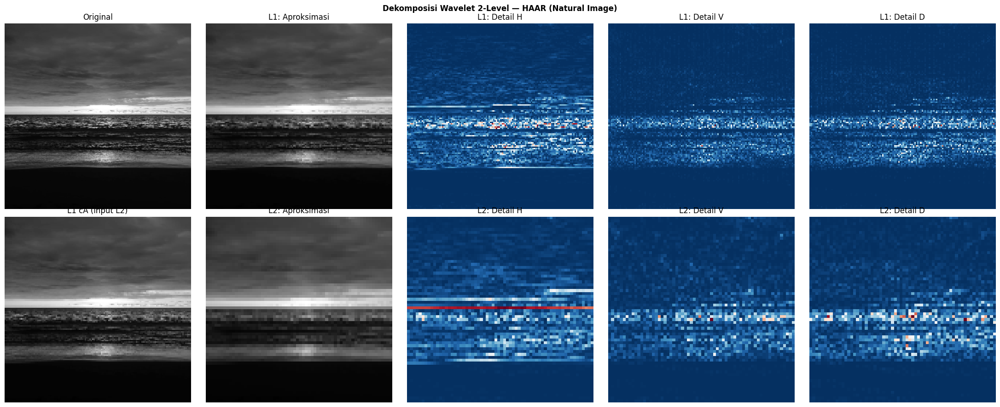


Rekonstruksi dari koefisien terpilih:
  Metode                                MSE   PSNR(dB)
  ----------------------------------------------------
  Rekonstruksi Penuh                   0.68      49.83
  Hanya Aproksimasi L1               106.84      27.84
  Wavelet Thresholding                47.07      31.40


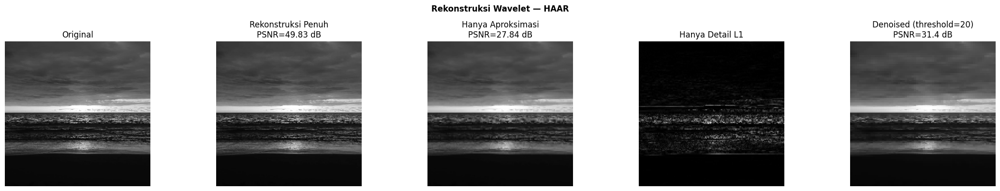


WAVELET TRANSFORM — DB4 (Periodic Noise Image)

Ukuran koefisien:
  Original   : (256, 256)
  Level 1 cA : (131, 131)  (Aproksimasi)
  Level 1 cH : (131, 131)  (Detail Horizontal)
  Level 2 cA : (69, 69)  (Aproksimasi Level 2)


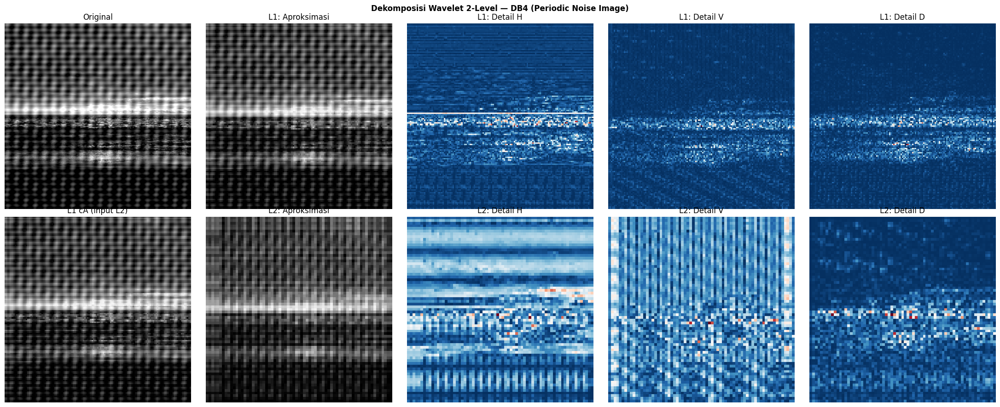


Rekonstruksi dari koefisien terpilih:
  Metode                                MSE   PSNR(dB)
  ----------------------------------------------------
  Rekonstruksi Penuh                   0.61      50.26
  Hanya Aproksimasi L1               103.03      28.00
  Wavelet Thresholding                77.90      29.22


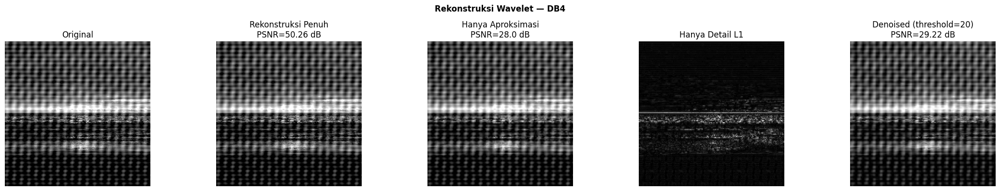


PERBANDINGAN WAVELET: HAAR vs DB4

  Wavelet    Metode                           MSE   PSNR(dB)   Time(ms)
  ------------------------------------------------------------
  haar       Rekonstruksi Penuh              0.68      49.83     3.7654
  haar       Wavelet Denoising              47.07      31.40     1.7463
  db4        Rekonstruksi Penuh              0.70      49.67     4.7438
  db4        Wavelet Denoising              44.33      31.66     1.9308


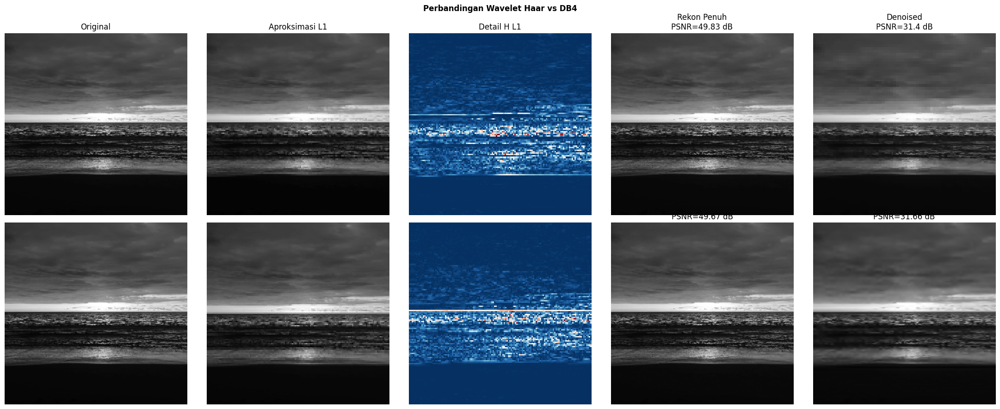


SELESAI


In [2]:
!pip install PyWavelets

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import time
import warnings
warnings.filterwarnings('ignore')

try:
    import pywt
    PYWT_AVAILABLE = True
except ImportError:
    PYWT_AVAILABLE = False
    print("PyWavelets tidak tersedia. Install: pip install PyWavelets")


# ============================================================
# BAGIAN 1: PERSIAPAN CITRA
# ============================================================

def load_or_create_images(image_path=None, size=256):
    """
    Load foto asli atau buat citra sintetik.
    Returns: natural image dan periodic noise image.
    """
    if image_path:
        img = cv2.imread(image_path)
        if img is not None:
            img = cv2.resize(img, (size, size))
            natural = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            print(f"Foto '{image_path}' berhasil di-load.")
        else:
            print(f"File tidak ditemukan, menggunakan citra sintetik.")
            natural = create_natural_image(size)
    else:
        natural = create_natural_image(size)

    periodic = create_periodic_noise_image(natural, size)
    return natural, periodic


def create_natural_image(size=256):
    """Buat citra sintetik dengan tekstur dan tepi yang kaya."""
    img = np.zeros((size, size), dtype=np.float32)

    # Bentuk geometris
    cv2.rectangle(img, (30, 30),   (110, 110), 200, -1)
    cv2.circle(img,    (190, 70),   50,         180, -1)
    cv2.ellipse(img,   (128, 190),  (70, 40),   0, 0, 360, 150, -1)
    cv2.line(img,      (10, 200),   (246, 200), 220, 2)
    cv2.line(img,      (128, 10),   (128, 246), 220, 2)

    # Tekstur gradient
    y, x = np.mgrid[0:size, 0:size]
    texture = 30 * np.sin(2 * np.pi * x / 32) * np.sin(2 * np.pi * y / 32)
    img += texture

    # Noise ringan
    img += np.random.normal(0, 8, img.shape)
    return np.clip(img, 0, 255).astype(np.uint8)


def create_periodic_noise_image(base_image, size=256):
    """Tambahkan noise periodik (sinusoidal) ke citra dasar."""
    img = base_image.astype(np.float32)
    x   = np.arange(size)
    y   = np.arange(size)
    xx, yy = np.meshgrid(x, y)

    # Beberapa komponen periodik dengan frekuensi berbeda
    noise  = 40 * np.sin(2 * np.pi * 20 * xx / size)   # horizontal 20 Hz
    noise += 30 * np.sin(2 * np.pi * 35 * yy / size)   # vertical 35 Hz
    noise += 20 * np.sin(2 * np.pi * (15 * xx + 10 * yy) / size)  # diagonal

    img += noise
    return np.clip(img, 0, 255).astype(np.uint8)


def show_input_images(natural, periodic):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(natural,  cmap='gray', vmin=0, vmax=255)
    axes[0].set_title(f'Citra Natural\nMean={natural.mean():.1f}, Std={natural.std():.1f}',
                      fontweight='bold')
    axes[0].axis('off')
    axes[1].imshow(periodic, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title(f'Citra Periodik\nMean={periodic.mean():.1f}, Std={periodic.std():.1f}',
                      fontweight='bold')
    axes[1].axis('off')
    plt.suptitle('Citra Input', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()


# ============================================================
# BAGIAN 2: TRANSFORMASI FOURIER
# ============================================================

def compute_fft(image):
    """Hitung FFT dan kembalikan komponen yang diperlukan."""
    f         = np.fft.fft2(image.astype(np.float32))
    fshift    = np.fft.fftshift(f)
    magnitude = np.abs(fshift)
    phase     = np.angle(fshift)
    mag_log   = np.log1p(magnitude)
    return f, fshift, magnitude, phase, mag_log


def visualize_fft(image, title=''):
    """Visualisasi magnitude spectrum, phase, dan rekonstruksi."""
    f, fshift, magnitude, phase, mag_log = compute_fft(image)

    # Rekonstruksi dari magnitude saja (phase = 0)
    mag_only  = np.fft.ifft2(np.fft.ifftshift(magnitude)).real
    mag_only  = np.clip(mag_only, 0, 255).astype(np.uint8)

    # Rekonstruksi dari phase saja (magnitude = 1)
    phase_only_f  = np.exp(1j * phase)
    phase_only    = np.abs(np.fft.ifft2(np.fft.ifftshift(phase_only_f)))
    phase_only    = cv2.normalize(phase_only, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Rekonstruksi penuh
    recon = np.abs(np.fft.ifft2(np.fft.ifftshift(fshift)))
    recon = np.clip(recon, 0, 255).astype(np.uint8)

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))

    axes[0, 0].imshow(image,     cmap='gray', vmin=0, vmax=255)
    axes[0, 0].set_title('Original', fontweight='bold'); axes[0, 0].axis('off')

    axes[0, 1].imshow(mag_log,   cmap='hot')
    axes[0, 1].set_title('Magnitude Spectrum (log)', fontweight='bold'); axes[0, 1].axis('off')

    axes[0, 2].imshow(phase,     cmap='hsv')
    axes[0, 2].set_title('Phase Spectrum', fontweight='bold'); axes[0, 2].axis('off')

    axes[1, 0].imshow(recon,     cmap='gray', vmin=0, vmax=255)
    axes[1, 0].set_title('Rekonstruksi Penuh', fontweight='bold'); axes[1, 0].axis('off')

    axes[1, 1].imshow(mag_only,  cmap='gray', vmin=0, vmax=255)
    axes[1, 1].set_title('Rekonstruksi Magnitude Saja', fontweight='bold'); axes[1, 1].axis('off')

    axes[1, 2].imshow(phase_only, cmap='gray', vmin=0, vmax=255)
    axes[1, 2].set_title('Rekonstruksi Phase Saja', fontweight='bold'); axes[1, 2].axis('off')

    plt.suptitle(f'Transformasi Fourier — {title}', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Identifikasi komponen frekuensi dominan
    size = image.shape[0]
    center = size // 2
    mag_flat   = magnitude.flatten()
    top_indices = np.argsort(mag_flat)[::-1][1:6]  # skip DC

    print(f"\nKomponen Frekuensi Dominan ({title}):")
    print(f"  {'Rank':<6} {'u (col)':>8} {'v (row)':>8} {'Magnitude':>12}")
    print(f"  {'-'*38}")
    for rank, idx in enumerate(top_indices, 1):
        r = idx // size - center
        c = idx %  size - center
        print(f"  {rank:<6} {c:>8} {r:>8} {mag_flat[idx]:>12.1f}")

    return fshift, magnitude, phase


# ============================================================
# BAGIAN 3: FILTERING DI DOMAIN FREKUENSI
# ============================================================

def make_ideal_filter(size, cutoff, filter_type='lowpass'):
    """Buat ideal lowpass atau highpass filter."""
    rows, cols = size, size
    crow, ccol = rows // 2, cols // 2
    y, x = np.ogrid[-crow:rows-crow, -ccol:cols-ccol]
    dist = np.sqrt(x*x + y*y)
    mask = np.zeros((rows, cols), dtype=np.float32)
    if filter_type == 'lowpass':
        mask[dist <= cutoff] = 1
    else:
        mask[dist >  cutoff] = 1
    return mask


def make_gaussian_filter(size, cutoff, filter_type='lowpass'):
    """Buat Gaussian lowpass atau highpass filter."""
    rows, cols = size, size
    crow, ccol = rows // 2, cols // 2
    y, x = np.ogrid[-crow:rows-crow, -ccol:cols-ccol]
    dist_sq = x*x + y*y
    glp = np.exp(-dist_sq / (2 * cutoff**2))
    if filter_type == 'lowpass':
        return glp.astype(np.float32)
    else:
        return (1 - glp).astype(np.float32)


def make_bandpass_filter(size, low_cut, high_cut):
    """Buat bandpass filter (gabungan LP dan HP)."""
    lp = make_gaussian_filter(size, high_cut, 'lowpass')
    hp = make_gaussian_filter(size, low_cut,  'highpass')
    return (lp * hp).astype(np.float32)


def make_notch_filter(size, freq_list, radius=5):
    """
    Buat notch filter untuk menghilangkan frekuensi periodik tertentu.
    freq_list: list of (u, v) koordinat frekuensi yang akan dihapus
    """
    mask  = np.ones((size, size), dtype=np.float32)
    crow  = size // 2
    ccol  = size // 2
    y, x  = np.ogrid[0:size, 0:size]

    for (u, v) in freq_list:
        # Hapus di (u,v) dan konjugatnya (-u,-v)
        for (cu, cv) in [(crow+v, ccol+u), (crow-v, ccol-u)]:
            dist = np.sqrt((x - cv)**2 + (y - cu)**2)
            mask[dist <= radius] = 0

    return mask


def apply_frequency_filter(image, mask):
    """Terapkan filter di domain frekuensi dan kembalikan citra hasil."""
    f      = np.fft.fft2(image.astype(np.float32))
    fshift = np.fft.fftshift(f)
    fshift_filtered = fshift * mask
    f_ishift = np.fft.ifftshift(fshift_filtered)
    result   = np.abs(np.fft.ifft2(f_ishift))
    return np.clip(result, 0, 255).astype(np.uint8)


def compute_metrics(clean, filtered):
    """Hitung MSE dan PSNR."""
    mse  = float(np.mean((clean.astype(float) - filtered.astype(float))**2))
    psnr = 10 * np.log10(255**2 / mse) if mse > 0 else float('inf')
    return round(mse, 2), round(psnr, 2)


def demo_frequency_filtering(natural, periodic):
    """Demo semua jenis filter di domain frekuensi."""
    size = natural.shape[0]

    print("\n" + "=" * 65)
    print("FILTERING DI DOMAIN FREKUENSI")
    print("=" * 65)

    # ── Ideal Filter ──
    cutoffs = [20, 50, 80]
    fig, axes = plt.subplots(2, len(cutoffs) + 1, figsize=(20, 8))

    axes[0, 0].imshow(natural, cmap='gray'); axes[0, 0].set_title('Original')
    axes[0, 0].axis('off')
    axes[1, 0].imshow(natural, cmap='gray'); axes[1, 0].set_title('Original')
    axes[1, 0].axis('off')

    print(f"\nIdeal Filter (Natural Image):")
    print(f"  {'Filter':<20} {'Cutoff':>8} {'MSE':>10} {'PSNR(dB)':>10}")
    print(f"  {'-'*50}")

    for col, co in enumerate(cutoffs, 1):
        lp = make_ideal_filter(size, co, 'lowpass')
        hp = make_ideal_filter(size, co, 'highpass')
        r_lp = apply_frequency_filter(natural, lp)
        r_hp = apply_frequency_filter(natural, hp)
        mse_lp, psnr_lp = compute_metrics(natural, r_lp)
        mse_hp, psnr_hp = compute_metrics(natural, r_hp)

        axes[0, col].imshow(r_lp, cmap='gray', vmin=0, vmax=255)
        axes[0, col].set_title(f'Ideal LP\ncutoff={co}\nPSNR={psnr_lp} dB', fontsize=8)
        axes[0, col].axis('off')
        axes[1, col].imshow(r_hp, cmap='gray', vmin=0, vmax=255)
        axes[1, col].set_title(f'Ideal HP\ncutoff={co}\nPSNR={psnr_hp} dB', fontsize=8)
        axes[1, col].axis('off')

        print(f"  {'Lowpass':<20} {co:>8} {mse_lp:>10.2f} {psnr_lp:>10.2f}")
        print(f"  {'Highpass':<20} {co:>8} {mse_hp:>10.2f} {psnr_hp:>10.2f}")

    plt.suptitle('Ideal Lowpass & Highpass Filter', fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

    # ── Gaussian Filter ──
    fig, axes = plt.subplots(2, len(cutoffs) + 1, figsize=(20, 8))
    axes[0, 0].imshow(natural, cmap='gray'); axes[0, 0].set_title('Original')
    axes[0, 0].axis('off')
    axes[1, 0].imshow(natural, cmap='gray'); axes[1, 0].set_title('Original')
    axes[1, 0].axis('off')

    print(f"\nGaussian Filter (Natural Image):")
    print(f"  {'Filter':<20} {'Cutoff':>8} {'MSE':>10} {'PSNR(dB)':>10}")
    print(f"  {'-'*50}")

    for col, co in enumerate(cutoffs, 1):
        glp = make_gaussian_filter(size, co, 'lowpass')
        ghp = make_gaussian_filter(size, co, 'highpass')
        r_glp = apply_frequency_filter(natural, glp)
        r_ghp = apply_frequency_filter(natural, ghp)
        mse_lp, psnr_lp = compute_metrics(natural, r_glp)
        mse_hp, psnr_hp = compute_metrics(natural, r_ghp)

        axes[0, col].imshow(r_glp, cmap='gray', vmin=0, vmax=255)
        axes[0, col].set_title(f'Gaussian LP\ncutoff={co}\nPSNR={psnr_lp} dB', fontsize=8)
        axes[0, col].axis('off')
        axes[1, col].imshow(r_ghp, cmap='gray', vmin=0, vmax=255)
        axes[1, col].set_title(f'Gaussian HP\ncutoff={co}\nPSNR={psnr_hp} dB', fontsize=8)
        axes[1, col].axis('off')

        print(f"  {'Lowpass':<20} {co:>8} {mse_lp:>10.2f} {psnr_lp:>10.2f}")
        print(f"  {'Highpass':<20} {co:>8} {mse_hp:>10.2f} {psnr_hp:>10.2f}")

    plt.suptitle('Gaussian Lowpass & Highpass Filter', fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

    # ── Notch Filter untuk Periodic Noise ──
    print(f"\nNotch Filter (Periodic Noise Image):")
    freq_list = [(20, 0), (0, 35), (15, 10), (-20, 0), (0, -35), (-15, -10)]
    notch  = make_notch_filter(size, freq_list, radius=6)
    r_notch = apply_frequency_filter(periodic, notch)
    mse_n, psnr_n = compute_metrics(natural, r_notch)

    _, fshift_p, _, _, mag_log_p = compute_fft(periodic)
    _, fshift_n, _, _, mag_log_n = compute_fft(r_notch)

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    axes[0, 0].imshow(periodic,  cmap='gray'); axes[0, 0].set_title('Periodic Noisy'); axes[0, 0].axis('off')
    axes[0, 1].imshow(mag_log_p, cmap='hot');  axes[0, 1].set_title('Spectrum Noisy'); axes[0, 1].axis('off')
    axes[0, 2].imshow(notch,     cmap='gray'); axes[0, 2].set_title('Notch Mask');     axes[0, 2].axis('off')
    axes[1, 0].imshow(r_notch,   cmap='gray', vmin=0, vmax=255)
    axes[1, 0].set_title(f'Hasil Notch Filter\nPSNR={psnr_n} dB'); axes[1, 0].axis('off')
    axes[1, 1].imshow(mag_log_n, cmap='hot')
    axes[1, 1].set_title('Spectrum After Notch'); axes[1, 1].axis('off')

    diff = np.abs(periodic.astype(int) - r_notch.astype(int)).astype(np.uint8)
    axes[1, 2].imshow(diff, cmap='hot')
    axes[1, 2].set_title('Perbedaan (Noise Removed)'); axes[1, 2].axis('off')

    plt.suptitle('Notch Filter untuk Periodic Noise', fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

    print(f"  MSE={mse_n}, PSNR={psnr_n} dB")


# ============================================================
# BAGIAN 4: SPASIAL VS FREKUENSI
# ============================================================

def compare_spatial_vs_frequency(natural):
    """Bandingkan filtering spasial vs frekuensi."""
    print("\n" + "=" * 65)
    print("PERBANDINGAN FILTER SPASIAL vs FREKUENSI")
    print("=" * 65)

    size = natural.shape[0]
    results = {}

    # Filter spasial
    t0 = time.perf_counter()
    sp_mean = cv2.blur(natural, (15, 15))
    t_sp_mean = (time.perf_counter() - t0) * 1000

    t0 = time.perf_counter()
    sp_gauss = cv2.GaussianBlur(natural, (15, 15), 3)
    t_sp_gauss = (time.perf_counter() - t0) * 1000

    # Filter frekuensi
    t0 = time.perf_counter()
    fq_ideal = apply_frequency_filter(natural, make_ideal_filter(size, 30))
    t_fq_ideal = (time.perf_counter() - t0) * 1000

    t0 = time.perf_counter()
    fq_gauss = apply_frequency_filter(natural, make_gaussian_filter(size, 30))
    t_fq_gauss = (time.perf_counter() - t0) * 1000

    methods = {
        'Spatial Mean 15×15' : (sp_mean,   t_sp_mean),
        'Spatial Gauss 15×15': (sp_gauss,  t_sp_gauss),
        'Freq Ideal LP-30'   : (fq_ideal,  t_fq_ideal),
        'Freq Gauss LP-30'   : (fq_gauss,  t_fq_gauss),
    }

    print(f"\n  {'Metode':<22} {'MSE':>8} {'PSNR(dB)':>10} {'Time(ms)':>10}")
    print(f"  {'-'*52}")

    fig, axes = plt.subplots(1, len(methods) + 1, figsize=(20, 4))
    axes[0].imshow(natural, cmap='gray'); axes[0].set_title('Original'); axes[0].axis('off')

    for col, (name, (img, t)) in enumerate(methods.items(), 1):
        mse, psnr = compute_metrics(natural, img)
        print(f"  {name:<22} {mse:>8.2f} {psnr:>10.2f} {t:>10.4f}")
        axes[col].imshow(img, cmap='gray', vmin=0, vmax=255)
        axes[col].set_title(f'{name}\nPSNR={psnr} dB\n{t:.2f} ms', fontsize=8)
        axes[col].axis('off')

    plt.suptitle('Perbandingan Filter Spasial vs Frekuensi', fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


# ============================================================
# BAGIAN 5: TRANSFORMASI WAVELET
# ============================================================

def demo_wavelet(image, wavelet_name='haar', title=''):
    """
    Dekomposisi wavelet 2-level dan rekonstruksi.
    """
    if not PYWT_AVAILABLE:
        print("PyWavelets tidak tersedia, skip wavelet demo.")
        return

    print(f"\n{'='*65}")
    print(f"WAVELET TRANSFORM — {wavelet_name.upper()} ({title})")
    print(f"{'='*65}")

    img_float = image.astype(np.float32)

    # ── Level 1 Decomposition ──
    cA1, (cH1, cV1, cD1) = pywt.dwt2(img_float, wavelet_name)

    # ── Level 2 Decomposition ──
    cA2, (cH2, cV2, cD2) = pywt.dwt2(cA1, wavelet_name)

    print(f"\nUkuran koefisien:")
    print(f"  Original   : {image.shape}")
    print(f"  Level 1 cA : {cA1.shape}  (Aproksimasi)")
    print(f"  Level 1 cH : {cH1.shape}  (Detail Horizontal)")
    print(f"  Level 2 cA : {cA2.shape}  (Aproksimasi Level 2)")

    # Visualisasi koefisien
    def norm_coeff(c):
        c_abs = np.abs(c)
        if c_abs.max() > 0:
            return (c_abs / c_abs.max() * 255).astype(np.uint8)
        return c_abs.astype(np.uint8)

    fig, axes = plt.subplots(2, 5, figsize=(22, 9))

    # Baris 1: Level 1
    axes[0, 0].imshow(image,          cmap='gray');       axes[0, 0].set_title('Original');          axes[0, 0].axis('off')
    axes[0, 1].imshow(norm_coeff(cA1), cmap='gray');      axes[0, 1].set_title('L1: Aproksimasi');   axes[0, 1].axis('off')
    axes[0, 2].imshow(norm_coeff(cH1), cmap='RdBu_r');    axes[0, 2].set_title('L1: Detail H');      axes[0, 2].axis('off')
    axes[0, 3].imshow(norm_coeff(cV1), cmap='RdBu_r');    axes[0, 3].set_title('L1: Detail V');      axes[0, 3].axis('off')
    axes[0, 4].imshow(norm_coeff(cD1), cmap='RdBu_r');    axes[0, 4].set_title('L1: Detail D');      axes[0, 4].axis('off')

    # Baris 2: Level 2
    axes[1, 0].imshow(norm_coeff(cA1), cmap='gray');      axes[1, 0].set_title('L1 cA (input L2)');  axes[1, 0].axis('off')
    axes[1, 1].imshow(norm_coeff(cA2), cmap='gray');      axes[1, 1].set_title('L2: Aproksimasi');   axes[1, 1].axis('off')
    axes[1, 2].imshow(norm_coeff(cH2), cmap='RdBu_r');    axes[1, 2].set_title('L2: Detail H');      axes[1, 2].axis('off')
    axes[1, 3].imshow(norm_coeff(cV2), cmap='RdBu_r');    axes[1, 3].set_title('L2: Detail V');      axes[1, 3].axis('off')
    axes[1, 4].imshow(norm_coeff(cD2), cmap='RdBu_r');    axes[1, 4].set_title('L2: Detail D');      axes[1, 4].axis('off')

    plt.suptitle(f'Dekomposisi Wavelet 2-Level — {wavelet_name.upper()} ({title})',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

    # ── Rekonstruksi dari koefisien terpilih ──
    print(f"\nRekonstruksi dari koefisien terpilih:")
    print(f"  {'Metode':<30} {'MSE':>10} {'PSNR(dB)':>10}")
    print(f"  {'-'*52}")

    fig, axes2 = plt.subplots(1, 5, figsize=(22, 4))
    axes2[0].imshow(image, cmap='gray', vmin=0, vmax=255)
    axes2[0].set_title('Original'); axes2[0].axis('off')

    # 1. Rekonstruksi penuh
    cA1_r = pywt.idwt2((cA2, (cH2, cV2, cD2)), wavelet_name)
    cA1_r = cA1_r[:cH1.shape[0], :cH1.shape[1]]
    recon_full = pywt.idwt2((cA1_r, (cH1, cV1, cD1)), wavelet_name)
    recon_full = np.clip(recon_full, 0, 255).astype(np.uint8)
    mse, psnr = compute_metrics(image, recon_full[:image.shape[0], :image.shape[1]])
    axes2[1].imshow(recon_full, cmap='gray', vmin=0, vmax=255)
    axes2[1].set_title(f'Rekonstruksi Penuh\nPSNR={psnr} dB'); axes2[1].axis('off')
    print(f"  {'Rekonstruksi Penuh':<30} {mse:>10.2f} {psnr:>10.2f}")

    # 2. Hanya aproksimasi L1 (zero detail)
    zero = np.zeros_like(cH1)
    recon_approx = pywt.idwt2((cA1, (zero, zero, zero)), wavelet_name)
    recon_approx = np.clip(recon_approx, 0, 255).astype(np.uint8)
    mse, psnr = compute_metrics(image, recon_approx[:image.shape[0], :image.shape[1]])
    axes2[2].imshow(recon_approx, cmap='gray', vmin=0, vmax=255)
    axes2[2].set_title(f'Hanya Aproksimasi\nPSNR={psnr} dB'); axes2[2].axis('off')
    print(f"  {'Hanya Aproksimasi L1':<30} {mse:>10.2f} {psnr:>10.2f}")

    # 3. Hanya detail (zero aproksimasi)
    zero_a = np.zeros_like(cA1)
    recon_detail = pywt.idwt2((zero_a, (cH1, cV1, cD1)), wavelet_name)
    recon_detail = cv2.normalize(np.abs(recon_detail), None, 0, 255,
                                  cv2.NORM_MINMAX).astype(np.uint8)
    axes2[3].imshow(recon_detail, cmap='gray', vmin=0, vmax=255)
    axes2[3].set_title('Hanya Detail L1'); axes2[3].axis('off')

    # 4. Denoising: threshold koefisien detail kecil
    threshold = 20
    cH1_t = pywt.threshold(cH1, threshold, mode='soft')
    cV1_t = pywt.threshold(cV1, threshold, mode='soft')
    cD1_t = pywt.threshold(cD1, threshold, mode='soft')
    cH2_t = pywt.threshold(cH2, threshold, mode='soft')
    cV2_t = pywt.threshold(cV2, threshold, mode='soft')
    cD2_t = pywt.threshold(cD2, threshold, mode='soft')

    cA1_dt = pywt.idwt2((cA2, (cH2_t, cV2_t, cD2_t)), wavelet_name)
    cA1_dt = cA1_dt[:cH1.shape[0], :cH1.shape[1]]
    recon_denoised = pywt.idwt2((cA1_dt, (cH1_t, cV1_t, cD1_t)), wavelet_name)
    recon_denoised = np.clip(recon_denoised, 0, 255).astype(np.uint8)
    mse, psnr = compute_metrics(image, recon_denoised[:image.shape[0], :image.shape[1]])
    axes2[4].imshow(recon_denoised, cmap='gray', vmin=0, vmax=255)
    axes2[4].set_title(f'Denoised (threshold={threshold})\nPSNR={psnr} dB')
    axes2[4].axis('off')
    print(f"  {'Wavelet Thresholding':<30} {mse:>10.2f} {psnr:>10.2f}")

    plt.suptitle(f'Rekonstruksi Wavelet — {wavelet_name.upper()}',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


def compare_wavelets(image):
    """Bandingkan haar dan db4."""
    if not PYWT_AVAILABLE:
        return

    print(f"\n{'='*65}")
    print("PERBANDINGAN WAVELET: HAAR vs DB4")
    print(f"{'='*65}")

    wavelets  = ['haar', 'db4']
    threshold = 20

    fig, axes = plt.subplots(len(wavelets), 5, figsize=(22, 9))

    print(f"\n  {'Wavelet':<10} {'Metode':<25} {'MSE':>10} {'PSNR(dB)':>10} {'Time(ms)':>10}")
    print(f"  {'-'*60}")

    for row, wname in enumerate(wavelets):
        img_f = image.astype(np.float32)

        t0 = time.perf_counter()
        cA1, (cH1, cV1, cD1) = pywt.dwt2(img_f, wname)
        cA2, (cH2, cV2, cD2) = pywt.dwt2(cA1,   wname)

        # Rekonstruksi penuh
        cA1_r      = pywt.idwt2((cA2, (cH2, cV2, cD2)), wname)
        cA1_r = cA1_r[:cH1.shape[0], :cH1.shape[1]]
        recon_full = pywt.idwt2((cA1_r, (cH1, cV1, cD1)), wname)
        recon_full = np.clip(recon_full, 0, 255).astype(np.uint8)
        t_full     = (time.perf_counter() - t0) * 1000

        # Denoising
        t0 = time.perf_counter()
        cH1_t = pywt.threshold(cH1, threshold, 'soft')
        cV1_t = pywt.threshold(cV1, threshold, 'soft')
        cD1_t = pywt.threshold(cD1, threshold, 'soft')
        cH2_t = pywt.threshold(cH2, threshold, 'soft')
        cV2_t = pywt.threshold(cV2, threshold, 'soft')
        cD2_t = pywt.threshold(cD2, threshold, 'soft')
        cA1_dt     = pywt.idwt2((cA2, (cH2_t, cV2_t, cD2_t)), wname)
        cA1_dt = cA1_dt[:cH1.shape[0], :cH1.shape[1]]
        recon_den  = pywt.idwt2((cA1_dt, (cH1_t, cV1_t, cD1_t)), wname)
        recon_den  = np.clip(recon_den, 0, 255).astype(np.uint8)
        t_den      = (time.perf_counter() - t0) * 1000

        h, w = image.shape
        mse_f, psnr_f = compute_metrics(image, recon_full[:h, :w])
        mse_d, psnr_d = compute_metrics(image, recon_den[:h, :w])

        print(f"  {wname:<10} {'Rekonstruksi Penuh':<25} {mse_f:>10.2f} {psnr_f:>10.2f} {t_full:>10.4f}")
        print(f"  {wname:<10} {'Wavelet Denoising':<25} {mse_d:>10.2f} {psnr_d:>10.2f} {t_den:>10.4f}")

        def norm_c(c):
            ca = np.abs(c); return (ca / ca.max() * 255).astype(np.uint8) if ca.max() > 0 else ca.astype(np.uint8)

        axes[row, 0].imshow(image,         cmap='gray'); axes[row, 0].set_ylabel(wname.upper(), fontweight='bold')
        axes[row, 0].set_title('Original' if row == 0 else ''); axes[row, 0].axis('off')
        axes[row, 1].imshow(norm_c(cA1),   cmap='gray')
        axes[row, 1].set_title('Aproksimasi L1' if row == 0 else ''); axes[row, 1].axis('off')
        axes[row, 2].imshow(norm_c(cH1),   cmap='RdBu_r')
        axes[row, 2].set_title('Detail H L1' if row == 0 else ''); axes[row, 2].axis('off')
        axes[row, 3].imshow(recon_full[:h, :w], cmap='gray', vmin=0, vmax=255)
        axes[row, 3].set_title(f'Rekon Penuh\nPSNR={psnr_f} dB' if row == 0 else f'PSNR={psnr_f} dB')
        axes[row, 3].axis('off')
        axes[row, 4].imshow(recon_den[:h, :w], cmap='gray', vmin=0, vmax=255)
        axes[row, 4].set_title(f'Denoised\nPSNR={psnr_d} dB' if row == 0 else f'PSNR={psnr_d} dB')
        axes[row, 4].axis('off')

    plt.suptitle('Perbandingan Wavelet Haar vs DB4', fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()


# ============================================================
# MAIN
# ============================================================

print("=" * 65)
print("ANALISIS DOMAIN FREKUENSI DAN WAVELET")
print("=" * 65)

np.random.seed(42)

IMAGE_PATH = 'img4.jpeg'

natural, periodic = load_or_create_images(IMAGE_PATH, size=256)
show_input_images(natural, periodic)

# FFT
print("\n" + "="*65)
print("TRANSFORMASI FOURIER")
print("="*65)
fshift_n, mag_n, phase_n = visualize_fft(natural,  'Natural Image')
fshift_p, mag_p, phase_p = visualize_fft(periodic, 'Periodic Noise Image')

# Frequency Filtering
demo_frequency_filtering(natural, periodic)

# Spasial vs Frekuensi
compare_spatial_vs_frequency(natural)

# Wavelet
demo_wavelet(natural,  'haar', 'Natural Image')
demo_wavelet(periodic, 'db4',  'Periodic Noise Image')
compare_wavelets(natural)

print("\n" + "="*65)
print("SELESAI")
print("="*65)